# Police Force Project - Data From 2015-2020

### Libraries

In [132]:
# Data Cleaning and EDA (Plots) packages:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import copy
import geopandas
import folium
import geopy
from geopy.geocoders import Nominatim
from branca.element import Template, MacroElement
from matplotlib import pyplot

#Modeling (Sign_of_Mental_Illness) packages:
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from prettytable import PrettyTable
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

### Loading the data

In [154]:
# We read in the data
df = pd.read_csv("https://github.com/washingtonpost/data-police-shootings/releases/download/v0.1/fatal-police-shootings-data.csv")
df.head(5)

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True


### Data Cleaning

In [155]:
# Let's have a look at the types of each column.
df.dtypes

id                           int64
name                        object
date                        object
manner_of_death             object
armed                       object
age                        float64
gender                      object
race                        object
city                        object
state                       object
signs_of_mental_illness       bool
threat_level                object
flee                        object
body_camera                   bool
longitude                  float64
latitude                   float64
is_geocoding_exact            bool
dtype: object

Based on the above there are a number of columns where we need to change the type. 
+ Date --> Change to date type.
+ manner_of_death --> Category
+ armed --> Category
+ gender --> Category
+ race --> Category
+ city --> Category
+ state --> Category
+ threat_level --> Category
+ flee --> Category

In [156]:
# We change all the above mentioned tyepes.
df['date'] = df['date'].astype('datetime64')
df['manner_of_death'] = df['manner_of_death'].astype('category')
df['armed'] = df['armed'].astype('category')
df['gender'] = df['gender'].astype('category')
df['race'] = df['race'].astype('category')
df['city'] = df['city'].astype('category')
df['state'] = df['state'].astype('category')
df['threat_level'] = df['threat_level'].astype('category')
df['flee'] = df['flee'].astype('category')

df.dtypes

id                                  int64
name                               object
date                       datetime64[ns]
manner_of_death                  category
armed                            category
age                               float64
gender                           category
race                             category
city                             category
state                            category
signs_of_mental_illness              bool
threat_level                     category
flee                             category
body_camera                          bool
longitude                         float64
latitude                          float64
is_geocoding_exact                   bool
dtype: object

id                           0
name                       220
date                         0
manner_of_death              0
armed                      213
age                        262
gender                       3
race                       605
city                         0
state                        0
signs_of_mental_illness      0
threat_level                 0
flee                       305
body_camera                  0
longitude                  283
latitude                   283
is_geocoding_exact           0
dtype: int64


<AxesSubplot:>

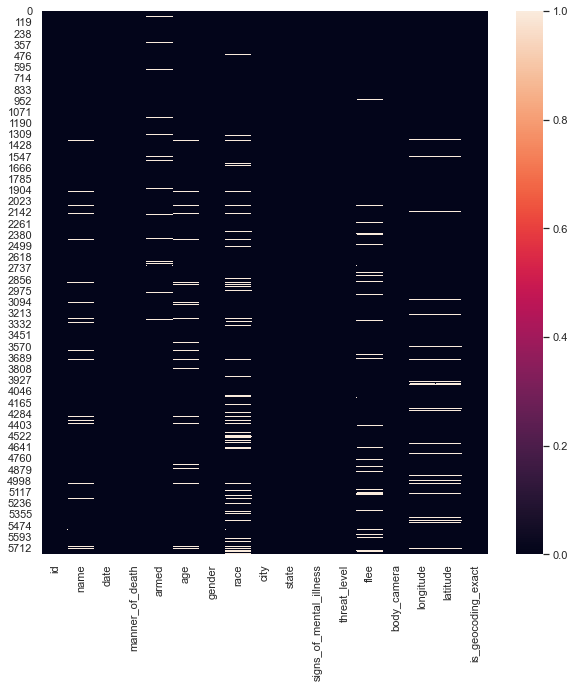

In [157]:
# We check how many null values we have.
# write code here
print(df.isnull().sum())

# Via a heatmap
fig, ax = plt.subplots(figsize=(10,10)) 
sns.heatmap(df.isnull(),ax=ax)

In [158]:
# We see that we have two null value for gender. I looked up the name of that person.
df[df['gender'].isnull()]

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
2657,2956,Scout Schultz,2017-09-16,shot,knife,21.0,NaN,W,Atlanta,GA,True,other,Not fleeing,False,NaN,NaN,True
5755,6290,NaN,2020-11-04,shot,gun,NaN,NaN,NaN,Kent,WA,False,attack,Foot,False,-122.169,47.419,True
5775,6318,NaN,2020-11-13,shot,gun,19.0,NaN,NaN,Cleveland,OH,False,attack,NaN,False,-81.647,41.489,True


In [159]:
# She was listed as bisexual, nonbinary and intersex.
# Hence we drop that particular row.
# We also drop the second row above, since we don't have any information on the name,age and race.
df.dropna(subset=['gender'], inplace=True)



In [160]:
# For each missing name we replace none with a string "Name not available"
df["name"].replace({None:'Name not available'}, inplace = True)

# For each missing armed value we replace none with "undetermined".
df["armed"].replace({None:'undetermined'}, inplace = True)

# For each missing race value we replace none with "U" as uknown.
df["race"].replace({None:'U'}, inplace = True)

# We fill in the none age values with the mean of it's gender and race.
# df['age'] = df["age"].fillna(df.groupby("gender")["age"].transform('mean'))
df['age'] = df["age"].fillna(df.groupby(["gender",'race'])["age"].transform('mean')).round(0)

# For each missing flee value we replace none with "U" as uknown.
df["flee"].replace({None:'U'}, inplace = True)

# Adding in day of the week into the dataframe, based on the date column
dayList = []
for i in df.date:
    dayList.append(i.day_name())

df["day"]= dayList
df['day'] = df['day'].astype('category')
df.isnull().sum()



id                           0
name                         0
date                         0
manner_of_death              0
armed                        0
age                          0
gender                       0
race                         0
city                         0
state                        0
signs_of_mental_illness      0
threat_level                 0
flee                         0
body_camera                  0
longitude                  282
latitude                   282
is_geocoding_exact           0
day                          0
dtype: int64

We will replace the race columnn categories with strings for now to make it visually more clear, when we conduct the explanatory analysis.

In [161]:
df["race"].replace({'W':'White, non-Hispanic'}, inplace = True)
df["race"].replace({'B':'Black, non-Hispanic'}, inplace = True)
df["race"].replace({'A':'Asian'}, inplace = True)
df["race"].replace({'N':'Native American'}, inplace = True)
df["race"].replace({'H':'Hispanic'}, inplace = True)
df["race"].replace({'O':'Other'}, inplace = True)
df["race"].replace({'U':'Unknown'}, inplace = True)

In [162]:
# Add missing coardinates to dataframe.

# We create a locator
locator = Nominatim(user_agent='myGeocoder')

# We iterate over the dataframe.
for index, row in df.iterrows():
    # We check if longitude is null
    if pd.isnull(row['longitude']):
        city = row['city']
        state = row['state']
        info = city,state
        s = ', '
        final_info = str(s.join(info))
        locator = Nominatim(user_agent='myGeocoder')
        location = locator.geocode(final_info)
        # We check if the location output's length is smaller then 2.
        if (location is None) or (len(location) < 2):
            # We continue
            continue
        else:
            # Else we update our dataframe and add the coardinates to the row.
            df.at[index,'latitude'] = location.latitude
            df.at[index,'longitude'] = location.longitude
            

In [163]:
# We see we have two more rows where there is no longitude and latitude.
df.isnull().sum()

id                         0
name                       0
date                       0
manner_of_death            0
armed                      0
age                        0
gender                     0
race                       0
city                       0
state                      0
signs_of_mental_illness    0
threat_level               0
flee                       0
body_camera                0
longitude                  2
latitude                   2
is_geocoding_exact         0
day                        0
dtype: int64

In [164]:
# We check which rows don't have coardinates.
df[df["longitude"].isnull()]

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact,day
2927,3247,Salvador Byassee,2017-12-26,shot,knife,34.0,M,Unknown,300 block of State Line Road,TN,False,other,Other,False,NaN,NaN,True,Tuesday
4957,5499,Joshua Franklin Roberts,2020-01-09,shot,gun,41.0,M,"White, non-Hispanic",Powatan Point,OH,False,other,Car,False,NaN,NaN,True,Thursday


In [165]:
# We update those coardinates and look them up online.

# Update index 2927
df.at[2927,'latitude'] = 36.3429
df.at[2927,'longitude'] = -88.7109

# Update index 4957
df.at[4957,'latitude'] = 39.8601
df.at[4957,'longitude'] = -80.8154

In [166]:
# We see we have two more rows where there is no longitude and latitude.
df.isnull().sum()

id                         0
name                       0
date                       0
manner_of_death            0
armed                      0
age                        0
gender                     0
race                       0
city                       0
state                      0
signs_of_mental_illness    0
threat_level               0
flee                       0
body_camera                0
longitude                  0
latitude                   0
is_geocoding_exact         0
day                        0
dtype: int64

We have to correct some coardinates as they were off in the data.


In [167]:
# We correct the coardinates.

#print(df_geo.loc[df_geo['name'] == "Gary Brown"])
df.at[5116,'latitude'] = 39.2668

#print(df_geo.loc[df_geo['name'] == "Juan Ayon-Barraza"])
df.at[5230,'latitude'] = 37.9358
df.at[52330,'longitude'] = -122.3477

#print(df_geo.loc[df_geo['name'] == "Javier Vidal"])
df.at[5224,'latitude'] = 35.2597
df.at[5224,'longitude'] = -118.9143

#print(df_geo.loc[df_geo['name'] == "Steven Vest"])
df.at[5700,'latitude'] = 39.7285
df.at[5700,'longitude'] = -121.8375

#print(df_geo.loc[df_geo['name'] == "Charles Ballard"])
df.at[4135,'latitude'] = 37.6948
df.at[4135,'longitude'] = -122.1137

#print(df_geo.loc[df_geo['name'] == "Kurt Phelps"])
df.at[5603,'latitude'] = 39.1958
df.at[5603,'longitude'] = -108.8132

#print(df_geo.loc[df_geo['name'] == "Archie Lawhon III"])
df.at[2942,'latitude'] = 35.2407
df.at[2942,'longitude'] = -92.0519

#print(df_geo.loc[df_geo['name'] == "Jessie A. Hudnall"])
df.at[5662,'latitude'] = 30.2885
df.at[5662,'longitude'] = -90.7004

#print(df_geo.loc[df_geo['name'] == "Thomas A. Powell"])
df.at[5225,'latitude'] = 44.9342
df.at[5225,'longitude'] = -68.6453

#print(df_geo.loc[df_geo['name'] == "Michael Thomas"])
df.at[5404,'latitude'] = 34.6868
df.at[5404,'longitude'] = -118.1542

#print(df_geo.loc[df_geo['name'] == "David Coborubio"])
df.at[1629,'latitude'] = 33.8958
df.at[1629,'longitude'] = -118.2201

#print(df_geo.loc[df_geo['name'] == "Stanley Stepanski III"])
df.at[3982,'latitude'] = 38.7521
df.at[3982,'longitude'] = -121.2880


In [168]:
# We drop the last column, because we don't use it at all.
# We also get rid of the last row, because they have a few NaN values and empty values. In other words no information in that row.
del df['is_geocoding_exact']
df = df[:-1]
df

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,day
0,3.0,Tim Elliot,2015-01-02,shot,gun,53.0,M,Asian,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,Friday
1,4.0,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,"White, non-Hispanic",Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,Friday
2,5.0,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,Hispanic,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,Saturday
3,8.0,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,"White, non-Hispanic",San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,Sunday
4,9.0,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,Hispanic,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,Sunday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5781,6314.0,Joshua D. Evans,2020-11-16,shot,gun,32.0,M,Unknown,Batesville,IN,False,attack,Not fleeing,False,-85.234,39.294,Monday
5782,6319.0,Javon Brice,2020-11-17,shot,gun,39.0,M,Unknown,La Vergne,TN,False,attack,Car,False,-86.556,36.015,Tuesday
5783,6320.0,Dustin James Acosta,2020-11-17,shot,gun,28.0,M,"White, non-Hispanic",St. Augustine,FL,False,attack,U,False,-81.333,29.905,Tuesday
5784,6322.0,James Horton,2020-11-17,shot,gun,42.0,M,Unknown,Hart County,KY,False,attack,Other,False,-85.849,37.310,Tuesday


In [169]:
df.describe()

,id,age,longitude,latitude
count,5783.000000,5783.000000,5783.000000,5783.000000
mean,3210.646896,37.324226,-97.239196,36.702864
std,1810.965725,12.817784,16.708796,5.437933
min,3.000000,6.000000,-162.881394,19.498000
25%,1643.500000,27.000000,-112.083000,33.480000
50%,3214.000000,35.000000,-94.355000,36.115000
75%,4787.500000,45.000000,-83.067000,39.971500
max,6322.000000,91.000000,-67.991128,71.301000


In [170]:
## We write our file to a pickel file so we don't have to run it multiple times.
df.to_pickle("clean_police_df.pkl")
df.to_csv("clean_police_df.csv")
#pd.read_pickle("/Users/navidmashinchi/Desktop/JupyterNotebook/DS Tools 1 /Project/clean_police_df.pkl")

In [19]:
## Summary Statistics in Subgroup of Race and Gender
df.groupby(['gender','race']).age.describe()[['count','mean','min','max']].round(0)

count  mean   min   max
gender race                                         
F      Asian                   4.0  39.0  30.0  49.0
       Black, non-Hispanic    48.0  35.0  20.0  72.0
       Hispanic               29.0  32.0  16.0  54.0
       Native American         5.0  31.0  23.0  38.0
       Other                   3.0  25.0  22.0  27.0
       Unknown                13.0  38.0  23.0  50.0
       White, non-Hispanic   151.0  40.0  12.0  84.0
M      Asian                  91.0  37.0  15.0  62.0
       Black, non-Hispanic  1324.0  33.0  13.0  88.0
       Hispanic              926.0  34.0  14.0  80.0
       Native American        76.0  32.0  14.0  58.0
       Other                  44.0  33.0  18.0  59.0
       Unknown               590.0  44.0  16.0  89.0
       White, non-Hispanic  2479.0  40.0   6.0  91.0

### Explanatory Analysis

<Figure size 1152x432 with 0 Axes>

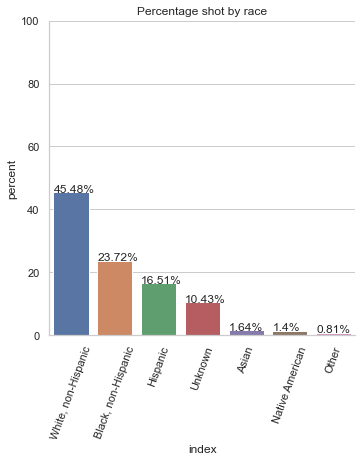

In [20]:
# Plot Percentage shot by race.
%matplotlib inline

df1 = df.race.value_counts(normalize=True)

df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()
df1

sns.set_theme(style="whitegrid")
plt.figure(figsize=(16, 6))
g = sns.catplot(x='index',y='percent',kind='bar',data=df1)
g.ax.set_ylim(0,100)
for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)
plt.title("Percentage shot by race")
_ = plt.xticks(rotation=70)


In [171]:
# This template below allows us to have a legend on our folium map. 
# Reference https://nbviewer.jupyter.org/gist/talbertc-usgs/18f8901fc98f109f2b71156cf3ac81cd
template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend (draggable!)</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:blue;opacity:0.7;'></span>Body Camera On</li>
    <li><span style='background:red;opacity:0.7;'></span>Body Camera Off</li>

    
  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

In [172]:
# Plot 2. Geo Plot using Folium with all the information of the victims.
#!pip install folium

# We take a copy of the original dataframe.
df_geo = copy.deepcopy(df)

# We drop the rows where we don't have long and lat values.
#df_geo = df = df[df['longitude'].notna()]

# We edit one of the long and lat value, which was wrong.
#print(df_geo.loc[df_geo['name'] == "Gary Brown"])
#df_geo.at[5116,'latitude'] = 39.2668
#print(df_geo.loc[df_geo['name'] == "Gary Brown"])

# We create a list for each row in the dataframe.
lst = df_geo.values.tolist()

# We create an empty list.
long_lat_lst = []

# We loop through the list and only append the long and lat values.
for i in lst:
    long_lat_lst.append((i[-3],i[-2]))

# We draw a folium map.
m = folium.Map(
location = [37.0902,-95.7129],
zoom_start=4
)

# We loop through the long and lat values.
# We add the -1, because the last row is full of None values.
for j in range(len(long_lat_lst)):
    
    # We grab the infos that we want to add to the popup.
    date = df_geo.iloc[j, df_geo.columns.get_loc("date")]
    name = df_geo.iloc[j, df_geo.columns.get_loc("name")]
    age = df_geo.iloc[j, df_geo.columns.get_loc("age")]
    gender = df_geo.iloc[j, df_geo.columns.get_loc("gender")]
    race = df_geo.iloc[j, df_geo.columns.get_loc("race")]
    city = df_geo.iloc[j, df_geo.columns.get_loc("city")]
    state = df_geo.iloc[j, df_geo.columns.get_loc("state")]
    manner_of_death = df_geo.iloc[j, df_geo.columns.get_loc("manner_of_death")]
    armed = df_geo.iloc[j, df_geo.columns.get_loc("armed")]
    signs_of_mental_illness = df_geo.iloc[j, df_geo.columns.get_loc("signs_of_mental_illness")]
    threat_level =  df_geo.iloc[j, df_geo.columns.get_loc("threat_level")]
    flee = df_geo.iloc[j, df_geo.columns.get_loc("flee")]
    body_camera = df_geo.iloc[j, df_geo.columns.get_loc("body_camera")]
    popup_text = "Name: {name} <br>""Age: {age} <br>""Race: {race} <br>""City: {city} <br>" "State: {state} <br>""Manner of death: {manner_of_death} <br>""Armed: {armed} <br>""Signs of mental illness: {signs_of_mental_illness} <br>""Threat level: {threat_level} <br>""Flee: {flee} <br>""Body camera: {body_camera} <br>".format(name=name,age=age, race=race, city = city, state=state,manner_of_death=manner_of_death, armed=armed, signs_of_mental_illness=signs_of_mental_illness,threat_level=threat_level, flee=flee,body_camera=body_camera)
    
    # We check if body_camera of the particular row is true. If so the color on the map will be blue.
    if df_geo.iloc[j, df_geo.columns.get_loc("body_camera")] == True:
        fill_col = 'blue'
    # Else the color will be red.
    else:
        fill_col = 'red'
    
    # We create the circles in the map. 
    folium.Circle(
    radius=100,
    location = [long_lat_lst[j][1],long_lat_lst[j][0]],
    color = fill_col,
    popup = folium.Popup(popup_text, max_width=300,min_width=300),
    fill = True).add_to(m)

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)
m


# import geopandas


# gdf = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df.longitude, df.latitude))

# world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

# # We restrict to North America.
# ax = world[world.continent == 'North America'].plot(color='blue', edgecolor='green',figsize=(30,15))

# # We can now plot our ``GeoDataFrame``.
# gdf.plot(ax=ax, color='red')

# plt.show()





In [173]:
# This template below allows us to have a legend on our folium map. 
# Reference https://nbviewer.jupyter.org/gist/talbertc-usgs/18f8901fc98f109f2b71156cf3ac81cd
template2 = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend (draggable!)</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:green;opacity:0.7;'></span>White</li>
    <li><span style='background:yellow;opacity:0.7;'></span>Black</li>
    <li><span style='background:red;opacity:0.7;'></span>Asian</li>
    <li><span style='background:pink;opacity:0.7;'></span>Native American</li>
    <li><span style='background:purple;opacity:0.7;'></span>Hispanic</li>
    <li><span style='background:blue;opacity:0.7;'></span>Others</li>
    <li><span style='background:orange;opacity:0.7;'></span>Unknown</li>

    
  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

In [174]:
# We draw a folium map.
m2 = folium.Map(
location = [37.0902,-95.7129],
zoom_start=4,
tiles="Stamen Toner"
)

# We loop through the long and lat values.
# We add the -1, because the last row is full of None values.

for j in range(len(long_lat_lst)-1):
    
    # We grab the infos that we want to add to the popup.
    date = df_geo.iloc[j, df_geo.columns.get_loc("date")]
    name = df_geo.iloc[j, df_geo.columns.get_loc("name")]
    age = df_geo.iloc[j, df_geo.columns.get_loc("age")]
    gender = df_geo.iloc[j, df_geo.columns.get_loc("gender")]
    race = df_geo.iloc[j, df_geo.columns.get_loc("race")]
    city = df_geo.iloc[j, df_geo.columns.get_loc("city")]
    state = df_geo.iloc[j, df_geo.columns.get_loc("state")]
    manner_of_death = df_geo.iloc[j, df_geo.columns.get_loc("manner_of_death")]
    armed = df_geo.iloc[j, df_geo.columns.get_loc("armed")]
    signs_of_mental_illness = df_geo.iloc[j, df_geo.columns.get_loc("signs_of_mental_illness")]
    threat_level =  df_geo.iloc[j, df_geo.columns.get_loc("threat_level")]
    flee = df_geo.iloc[j, df_geo.columns.get_loc("flee")]
    body_camera = df_geo.iloc[j, df_geo.columns.get_loc("body_camera")]
    popup_text = "Name: {name} <br>""Age: {age} <br>""Race: {race} <br>""City: {city} <br>" "State: {state} <br>""Manner of death: {manner_of_death} <br>""Armed: {armed} <br>""Signs of mental illness: {signs_of_mental_illness} <br>""Threat level: {threat_level} <br>""Flee: {flee} <br>""Body camera: {body_camera} <br>".format(name=name,age=age, race=race, city = city, state=state,manner_of_death=manner_of_death, armed=armed, signs_of_mental_illness=signs_of_mental_illness,threat_level=threat_level, flee=flee,body_camera=body_camera)
    
   
    if df_geo.iloc[j, df_geo.columns.get_loc("race")] == 'White, non-Hispanic':
        fill_col = 'green'
    elif df_geo.iloc[j, df_geo.columns.get_loc("race")] == 'Black, non-Hispanic':
        fill_col = 'yellow'
    elif df_geo.iloc[j, df_geo.columns.get_loc("race")] == 'Asian':
        fill_col = 'red'
    elif df_geo.iloc[j, df_geo.columns.get_loc("race")] == 'Native American':
        fill_col = 'pink'
    elif df_geo.iloc[j, df_geo.columns.get_loc("race")] == 'Hispanic':
        fill_col = 'purple'
    elif df_geo.iloc[j, df_geo.columns.get_loc("race")] == 'Other':
        fill_col = 'blue'
    # Else the color will be red.
    else:
        fill_col = 'orange'
    
    # We create the circles in the map. 
    folium.Circle(
    radius=100,
    location = [long_lat_lst[j][1],long_lat_lst[j][0]],
    color = fill_col,
    popup = folium.Popup(popup_text, max_width=300,min_width=300),
    fill = True).add_to(m2)

macro2 = MacroElement()
macro2._template = Template(template2)

m2.get_root().add_child(macro2)

m2


In [25]:
# We plot a graph that shows the count of shootings by year.
df_with_year = copy.deepcopy(df)
df_with_year["Year"]=df_with_year['date'].dt.year
df_with_year_column = df_with_year.groupby("Year").count()

year_id_series = df_with_year_column["id"]
year_id_series

Year
2015    994
2016    961
2017    985
2018    990
2019    999
2020    854
Name: id, dtype: int64

<AxesSubplot:title={'center':'Shootings by Year'}, xlabel='Year'>

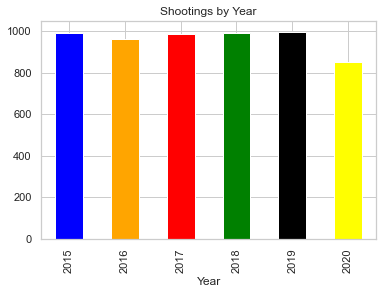

In [26]:
year_id_series.plot(x=year_id_series.index,y=year_id_series.values,kind = "bar",title="Shootings by Year",color=['blue','orange','red','green','black','yellow'])

As we can see above, the numbers decreased from 994 to 961 in the year 2015-2016. However we had an increase between 2016-2019. In year 2020 the numbers decreased.

Text(0.5, 1.0, 'Shooting By State -- Non Gun Related')

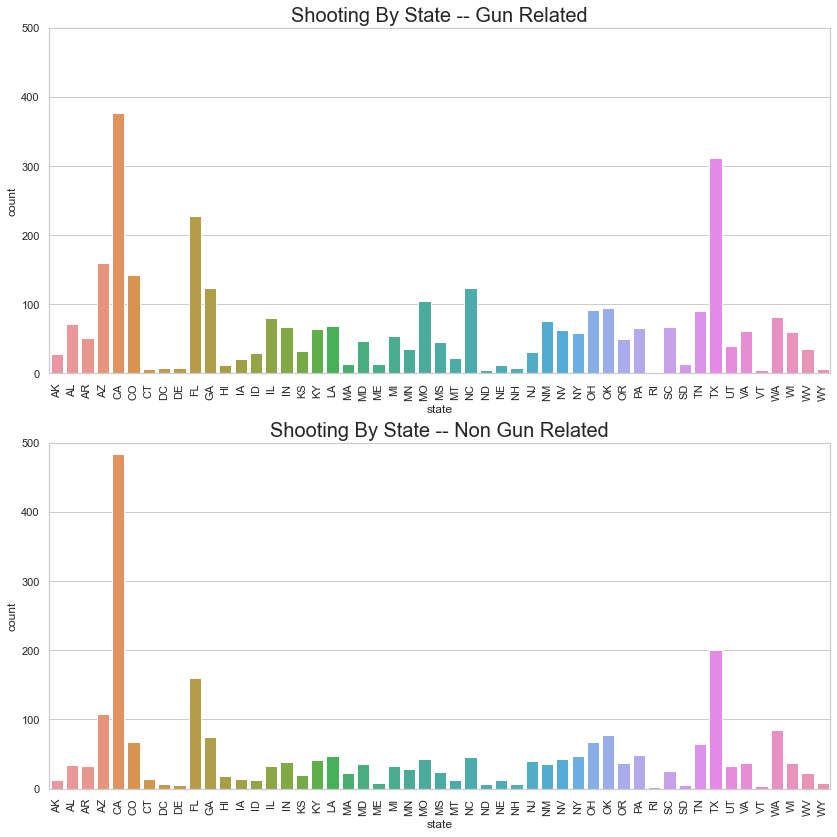

In [27]:
df.sort_values(by=['state'], inplace=True)
gun_related = df[df.armed.str.contains('gun')==True]
nongun_related = df[df.armed.str.contains('gun')!=True]

f, (ax1, ax2) = plt.subplots(2, 1, figsize= (14,14))
# f, (ax1) = plt.subplots(1, 1, figsize= (14,7))

sns.countplot(data = gun_related, x='state',ax=ax1)
sns.countplot(data = nongun_related, x='state',ax=ax2)

plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylim([0,500])
ax2.set_ylim([0,500])

ax1.set_title("Shooting by State -- Gun Related".title(), fontsize=20)
ax2.set_title("Shooting by State -- Non Gun Related".title(), fontsize=20)


# plt.savefig('shooting_by_state2.png')


(0.0, 100.0)

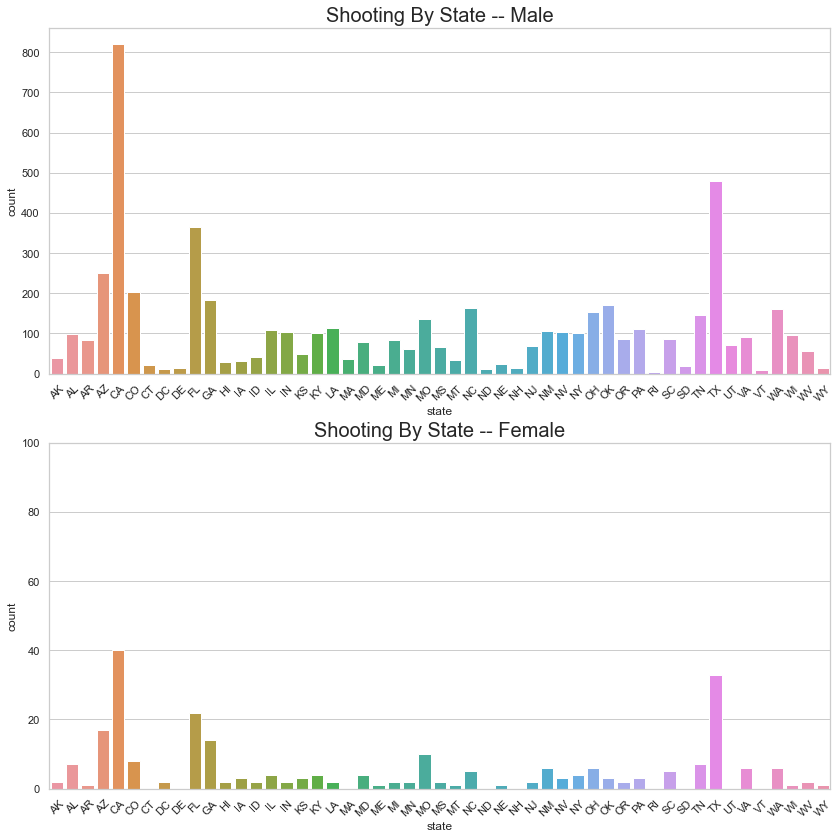

In [28]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize= (14,14))
# sns.despine(left=True)
sns.countplot(data = df.query("gender == 'M'"), x='state',ax=ax1)
sns.countplot(data = df.query("gender == 'F'"), x='state',ax=ax2)


plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)


ax1.set_title("Shooting by State -- Male".title(), fontsize=20)
ax2.set_title("Shooting by State -- female".title(), fontsize=20)
ax2.set_ylim([0,100])


# plt.savefig('shooting_by_state.png')



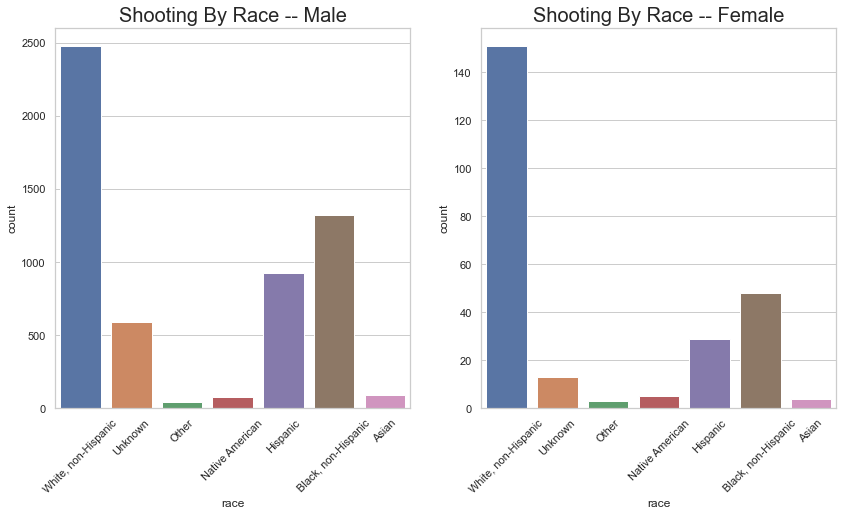

In [29]:
df.sort_values(by=['race'], inplace=True, ascending = False)

f, (ax1, ax2) = plt.subplots(1, 2, figsize= (14,7))
# sns.despine(left=True)
sns.countplot(data = df.query("gender == 'M'"), x='race',ax=ax1)
sns.countplot(data = df.query("gender == 'F'"), x='race',ax=ax2)


plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)


ax1.set_title("Shooting by Race -- Male".title(), fontsize=20)
ax2.set_title("Shooting by Race -- female".title(), fontsize=20)


plt.savefig('shooting_by_race.png')


Text(0.5, 1.0, 'Distribution Of Ages, Based On Race (Gun Related)')

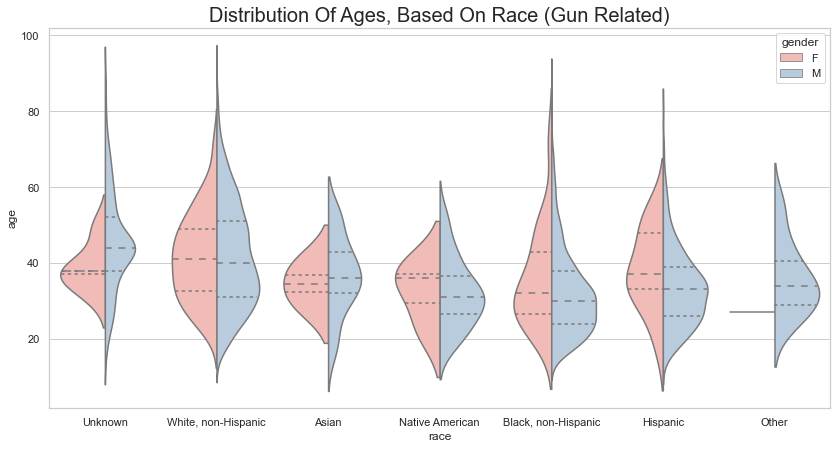

In [30]:
f, ax1 = plt.subplots(1,1, figsize= (14,7))
sns.violinplot(x="race", 
               y="age", 
               hue="gender", 
               split=True, 
               data=gun_related, 
               ax = ax1, 
               palette='Pastel1', 
              inner = "quartile")

ax1.set_title("Distribution of Ages, based on race (Gun Related)".title(), fontsize=20)



Text(0.5, 1.0, 'Distribution Of Ages, Based On Race (Non Gun Related)')

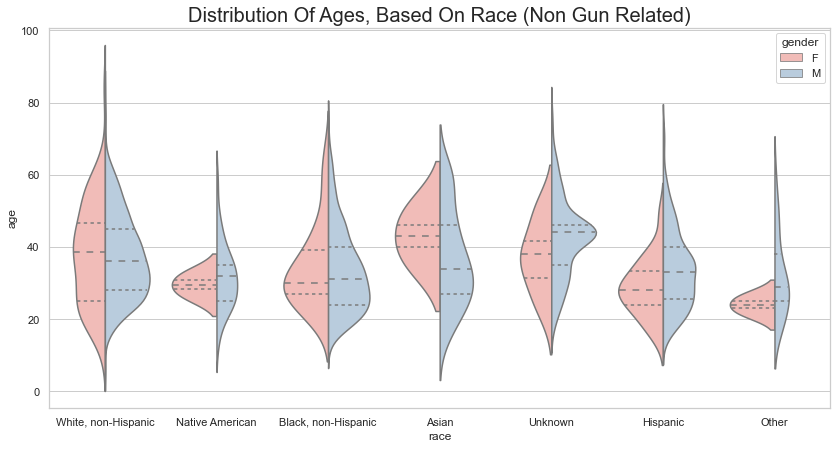

In [31]:
f, ax1 = plt.subplots(1,1, figsize= (14,7))
sns.violinplot(x="race", 
               y="age",
               hue="gender", 
               split=True, 
               data=nongun_related, 
               ax = ax1, 
               palette='Pastel1', 
              inner='quartile')
ax1.set_title("Distribution of Ages, based on race (Non Gun Related)".title(), fontsize=20)


Text(0.5, 1.0, 'Distribution Of Ages, Based On Race (Sign Of Mental Illness)')

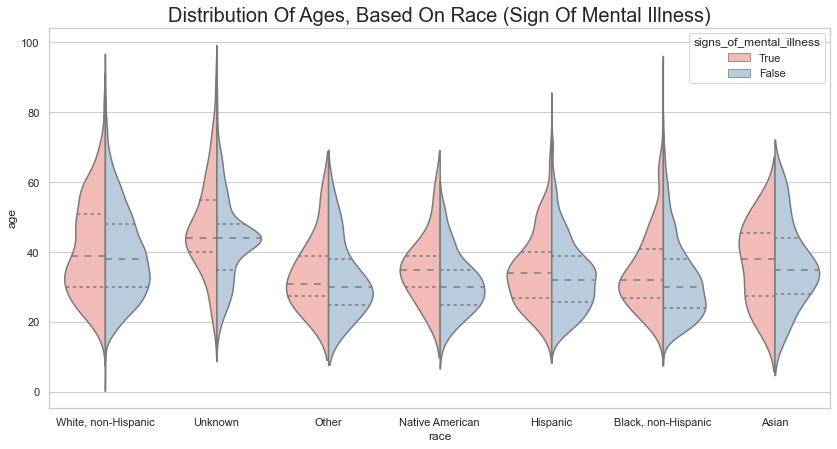

In [32]:
f, ax1 = plt.subplots(1,1, figsize= (14,7))
sns.violinplot(x="race", 
               y="age",
               data=df,
               split = True,
               hue = 'signs_of_mental_illness',
               hue_order = [True,False],
               ax = ax1, 
               palette='Pastel1',
              inner='quartile')
ax1.set_title("Distribution of Ages, based on race (Sign of Mental Illness)".title(), fontsize=20)

Text(0.5, 1.0, 'Distribution Of Ages, Based On Race (Sign Of Mental Illness)')

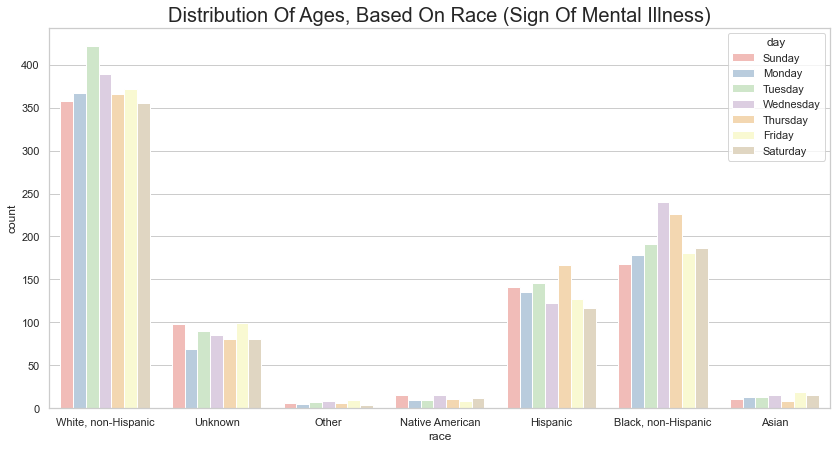

In [33]:
f, ax1 = plt.subplots(1,1, figsize= (14,7))
sns.countplot(x="race", 
               data=df,
               hue = 'day',
               ax = ax1, 
               palette='Pastel1', 
             hue_order = ['Sunday','Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', "Saturday"])
ax1.set_title("Distribution of Ages, based on race (Sign of Mental Illness)".title(), fontsize=20)

Text(0.5, 1.0, 'Distribution Of Day')

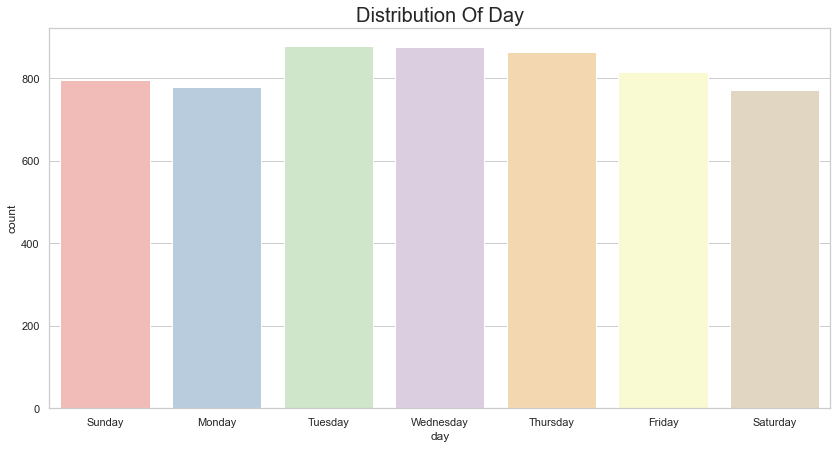

In [34]:
f, ax1 = plt.subplots(1,1, figsize= (14,7))
sns.countplot(x="day", 
               data=df,
               ax = ax1, 
               palette='Pastel1', 
              order = ['Sunday','Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', "Saturday"])
ax1.set_title("Distribution of Day".title(), fontsize=20)

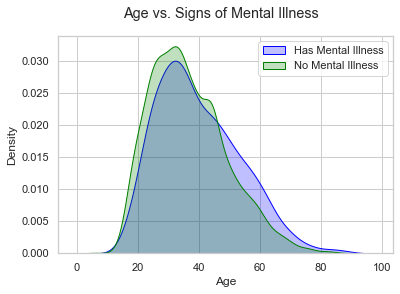

In [35]:
fig, ax = plt.subplots()

sns.kdeplot(df[df["signs_of_mental_illness"]==True]["age"], shade=True, color="blue", label="Has Mental Illness", ax=ax)
sns.kdeplot(df[df["signs_of_mental_illness"]==False]["age"], shade=True, color="green", label="No Mental Illness", ax=ax)

ax.set_xlabel("Age")
ax.set_ylabel("Density")


fig.suptitle("Age vs. Signs of Mental Illness")
ax.legend()

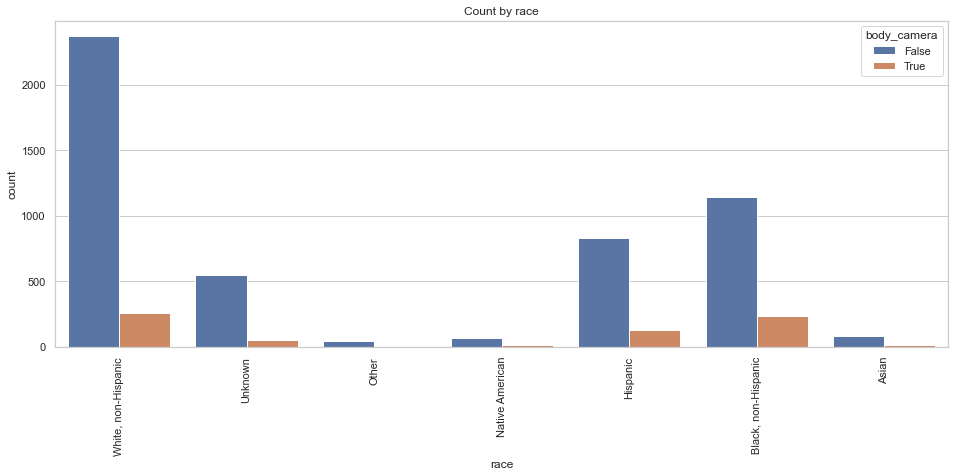

In [36]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(16, 6))
ax = sns.countplot(x="race", hue='body_camera', data=df)
plt.title("Count by race")
_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

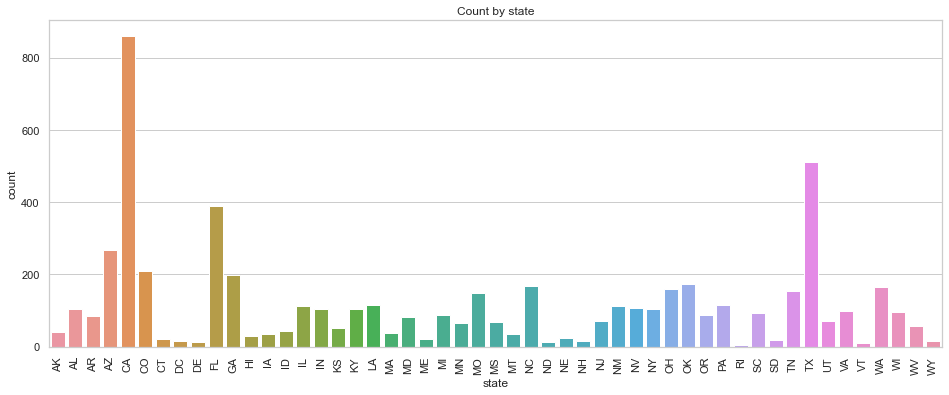

In [37]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(16, 6))
ax = sns.countplot(x="state", data=df)
plt.title("Count by state")
_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

Observation: We can see that most incidents happened in California followed by Texas and Florida.

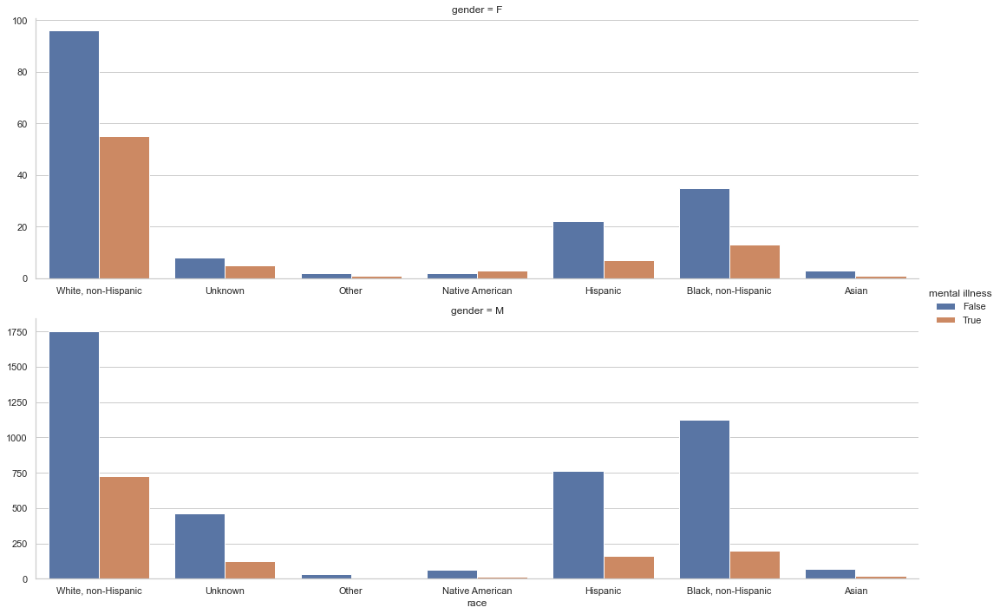

In [38]:
g = sns.FacetGrid(df, row= 'gender', height=5, aspect=3, sharex=False, sharey= False)
g.map_dataframe(sns.countplot, 'race', hue='signs_of_mental_illness' , palette=sns.color_palette())
#Below title should probalby be mental illness not gender
g.add_legend(title= "mental illness")
axes = g.axes.flatten()

In [39]:
table_states_pop = pd.read_html('https://worldpopulationreview.com/states', header =0)
stateArray=table_states_pop[0]
#That site had a csv file I brought in just in case
#This is a sample from online:
stateArray.head(10)

,Rank,State,2020 Pop.,2020 Growth,2018 Pop.,2010 Census,Growth Since 2010,% of US,Density (p/mi²)
0,1,California,39937500,0.96%,39557000,37320900,7.01%,11.94%,256
1,2,Texas,29472300,2.68%,28701800,25242700,16.76%,8.81%,113
2,3,Florida,21993000,3.26%,21299300,18845800,16.70%,6.58%,410
3,4,New York,19440500,-0.52%,19542200,19400100,0.21%,5.81%,413
4,5,Pennsylvania,12820900,0.11%,12807100,12711200,0.86%,3.83%,287
5,6,Illinois,12659700,-0.64%,12741100,12840800,-1.41%,3.79%,228
6,7,Ohio,11747700,0.50%,11689400,11539300,1.81%,3.51%,288
7,8,Georgia,10736100,2.06%,10519500,9711810,10.55%,3.21%,187
8,9,North Carolina,10611900,2.20%,10383600,9574290,10.84%,3.17%,218
9,10,Michigan,10045000,0.49%,9995920,9877540,1.70%,3.00%,178


In [40]:
#Need to convert state so found easy dictionary on line.
states = {
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}
# stateArray['StateAbbv']=[states.keys()== if state in states.values() else None for state in stateArray['State']]
abbrvs=[]
for index, state in stateArray.iterrows():
    for k,v in states.items():
#         print(k,"heres k")
#         print(v, 'heres v')
#         input()
        if state['State'] == v:
#             state['StateAbbv']=k
            addstate=k
            abbrvs.append(addstate)
            break
#         else:
#     addstate=None
#     abbrvs.append(addstate)
stateArray['StateAbbv']=abbrvs
# stateArray.head(10)
# stateArray.drop(columns=['StateAbbv'], axis=1, inplace=True)
stateArray
# type(states)

,Rank,State,2020 Pop.,2020 Growth,2018 Pop.,2010 Census,Growth Since 2010,% of US,Density (p/mi²),StateAbbv
0,1,California,39937500,0.96%,39557000,37320900,7.01%,11.94%,256,CA
1,2,Texas,29472300,2.68%,28701800,25242700,16.76%,8.81%,113,TX
2,3,Florida,21993000,3.26%,21299300,18845800,16.70%,6.58%,410,FL
3,4,New York,19440500,-0.52%,19542200,19400100,0.21%,5.81%,413,NY
4,5,Pennsylvania,12820900,0.11%,12807100,12711200,0.86%,3.83%,287,PA
5,6,Illinois,12659700,-0.64%,12741100,12840800,-1.41%,3.79%,228,IL
6,7,Ohio,11747700,0.50%,11689400,11539300,1.81%,3.51%,288,OH
7,8,Georgia,10736100,2.06%,10519500,9711810,10.55%,3.21%,187,GA
8,9,North Carolina,10611900,2.20%,10383600,9574290,10.84%,3.17%,218,NC
9,10,Michigan,10045000,0.49%,9995920,9877540,1.70%,3.00%,178,MI


In [41]:
dfCountByState=df.groupby('state').count()['id']
dfCountByState.head(5)
# type(dfCountByState) # pandas.core.series.Series

state
AK     41
AL    105
AR     84
AZ    267
CA    860
Name: id, dtype: int64

In [42]:
populationList=[]
popPer100k=[]
for state, amt in dfCountByState.items():
#     print(state, amt)
#     input()
#     if state in stateArray['StateAbbv']:
    populationState=stateArray['2020 Pop.'].where(stateArray['StateAbbv']==state).dropna().values[0]
#     print(populationState)
#     input()
    populationList.append(populationState)
    shotPer100k=(amt/populationState)*100000
    popPer100k.append(shotPer100k)

stateCountPercentDF=pd.DataFrame(list(zip(dfCountByState, populationList, popPer100k)),
                                index=dfCountByState.index,
                                columns=['Shot_By_State', 'State_Pop', 'ShotPer_100k'])
stateCountPercentDF

,Shot_By_State,State_Pop,ShotPer_100k
state,,,
AK,41,734002.0,5.585816
AL,105,4908620.0,2.139094
AR,84,3039000.0,2.764067
AZ,267,7378490.0,3.618627
CA,860,39937500.0,2.153365
CO,210,5845530.0,3.592489
CT,21,3563080.0,0.589378
DC,14,720687.0,1.942591
DE,13,982895.0,1.322623


Text(0.5, 1.0, 'Percent shot per 100k by state')

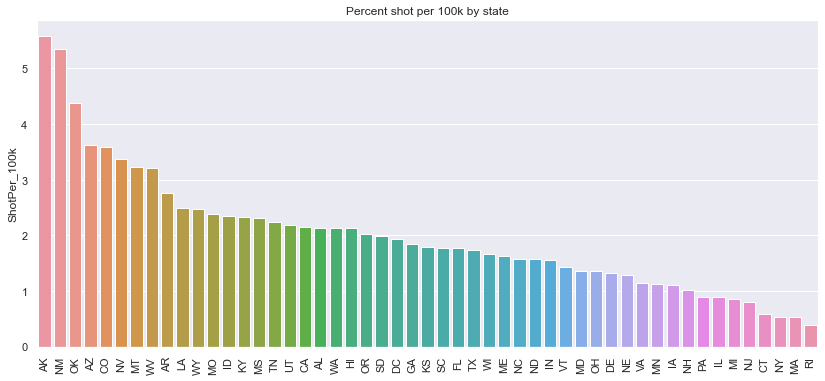

In [43]:
sns.set_theme(style="darkgrid")
states=stateCountPercentDF.index.tolist()

plt.figure(figsize=(14, 6))
# fig, ax = pyplot.subplots(figsize=(10,8)) #if use this put ax=ax in barplot
perGraph=sns.barplot(data=stateCountPercentDF, x=states, y='ShotPer_100k', 
                     order=stateCountPercentDF.sort_values('ShotPer_100k', ascending=False).index)
_=perGraph.set_xticklabels(perGraph.get_xticklabels(), rotation=90)#underscore removes printing to screen this
plt.title("Percent shot per 100k by state")


In [44]:
url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
state_geo = f'{url}/us-states.json'
#stateCountPercentDF
m=folium.Map(location=[48, -102], zoom_start=3)
folium.Choropleth (
    geo_data=state_geo,
    name='choropleth',
    data=stateCountPercentDF,
    columns=[stateCountPercentDF.index, 'ShotPer_100k'],
    key_on='feature.id',
    fill_color='PuRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Percent shot per 100k by state'
).add_to(m)

folium.LayerControl().add_to(m)

m

### Modeling (Signs Of Mental Illness)

#### Signs Of Mental Illness
In this model we are going to predict signs_of_mental_illness. We will be covering 5 differnt models and choose the best one. The models that we are going to train are the following:

- Logistic Regression
- SVC (Support Vector Classification)
- SGD (Stochastic Gradient Descent)
- Decision Tree
- Random Forest

In [45]:
# We take a copy of our source data.
model_df = copy.deepcopy(df)
model_df

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,day
2697,2998.0,Micah McComas,2017-10-01,shot,unarmed,41.0,M,"White, non-Hispanic",Seward,AK,False,other,Car,True,-149.437000,60.126000,Sunday
116,157.0,Michael K. Casper,2015-02-16,shot,gun,26.0,M,"White, non-Hispanic",Boise,ID,False,attack,Not fleeing,False,-116.222000,43.579000,Monday
5180,5696.0,Shane Farwell,2020-03-28,shot,gun,46.0,M,"White, non-Hispanic",Caldwell,ID,False,attack,Not fleeing,False,-116.689416,43.667874,Saturday
4711,5117.0,Amber Lea Dewitt,2019-10-20,shot,toy weapon,33.0,F,"White, non-Hispanic",Boise,ID,True,attack,Not fleeing,True,-116.234000,43.639000,Sunday
2948,3287.0,Robert Hansen,2018-01-04,shot,gun,27.0,M,"White, non-Hispanic",Boise,ID,False,attack,Not fleeing,False,-116.224000,43.620000,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4328,4753.0,Jesse Sarey,2019-05-31,shot,unarmed,26.0,M,Asian,Auburn,WA,True,other,Not fleeing,False,-122.214000,47.295000,Friday
160,249.0,Carl Lao,2015-03-04,shot,gun,28.0,M,Asian,Stockton,CA,False,attack,Not fleeing,False,-121.286000,37.948000,Wednesday
3493,3817.0,Larry San Nicolas,2018-07-01,shot,sword,60.0,M,Asian,Grandview,MO,False,other,Not fleeing,False,-94.524000,38.855000,Sunday
4951,5356.0,Dallas Pearce,2020-01-06,shot,toy weapon,33.0,M,Asian,Honolulu,HI,False,other,Not fleeing,False,-157.855676,21.304547,Monday


In [46]:
# We convert the body_camera column to binary numbers. False = 0 and True = 1.
# We convert the gender column to binary numbers. Male = 1 and Female = 0.
# We convert the signs_of_mental_illness column to binary numbers. False = 0 and True = 1.
# We convert the manner_of_death column to binary numbers. shot = 0 and shot and Tasered = 1.

le = preprocessing.LabelEncoder()
model_df["body_camera"]= le.fit_transform(model_df['body_camera'])
model_df["gender"]= le.fit_transform(model_df['gender'])
model_df["signs_of_mental_illness"]= le.fit_transform(model_df['signs_of_mental_illness'])
model_df["manner_of_death"]= le.fit_transform(model_df['manner_of_death'])


model_df['manner_of_death'] = model_df['manner_of_death'].astype('category')
model_df['gender'] = model_df['gender'].astype('category')
model_df['signs_of_mental_illness'] = model_df['signs_of_mental_illness'].astype('category')
model_df['body_camera'] = model_df['body_camera'].astype('category')


model_df

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,day
2697,2998.0,Micah McComas,2017-10-01,0,unarmed,41.0,1,"White, non-Hispanic",Seward,AK,0,other,Car,1,-149.437000,60.126000,Sunday
116,157.0,Michael K. Casper,2015-02-16,0,gun,26.0,1,"White, non-Hispanic",Boise,ID,0,attack,Not fleeing,0,-116.222000,43.579000,Monday
5180,5696.0,Shane Farwell,2020-03-28,0,gun,46.0,1,"White, non-Hispanic",Caldwell,ID,0,attack,Not fleeing,0,-116.689416,43.667874,Saturday
4711,5117.0,Amber Lea Dewitt,2019-10-20,0,toy weapon,33.0,0,"White, non-Hispanic",Boise,ID,1,attack,Not fleeing,1,-116.234000,43.639000,Sunday
2948,3287.0,Robert Hansen,2018-01-04,0,gun,27.0,1,"White, non-Hispanic",Boise,ID,0,attack,Not fleeing,0,-116.224000,43.620000,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4328,4753.0,Jesse Sarey,2019-05-31,0,unarmed,26.0,1,Asian,Auburn,WA,1,other,Not fleeing,0,-122.214000,47.295000,Friday
160,249.0,Carl Lao,2015-03-04,0,gun,28.0,1,Asian,Stockton,CA,0,attack,Not fleeing,0,-121.286000,37.948000,Wednesday
3493,3817.0,Larry San Nicolas,2018-07-01,0,sword,60.0,1,Asian,Grandview,MO,0,other,Not fleeing,0,-94.524000,38.855000,Sunday
4951,5356.0,Dallas Pearce,2020-01-06,0,toy weapon,33.0,1,Asian,Honolulu,HI,0,other,Not fleeing,0,-157.855676,21.304547,Monday


In [47]:
# We one hot encode the following columns= armed,race,signs_of_mental_ilness_threat_level and flee
model_df = pd.get_dummies(data=model_df, columns=['armed','race','threat_level','flee','day'])

# We drop the categorical columns we converted earlier as well. Name, Ticket, and PassengerId.
model_df.drop(["id","name","date","city","state","longitude","latitude"], axis=1, inplace=True)

model_df.to_pickle("model1.pkl")
model_df

,manner_of_death,age,gender,signs_of_mental_illness,body_camera,armed_Airsoft pistol,armed_BB gun,armed_BB gun and vehicle,armed_Taser,armed_air conditioner,...,flee_Not fleeing,flee_Other,flee_U,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
2697,0,41.0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
116,0,26.0,1,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
5180,0,46.0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
4711,0,33.0,0,1,1,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
2948,0,27.0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4328,0,26.0,1,1,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
160,0,28.0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3493,0,60.0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
4951,0,33.0,1,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0


In [48]:
# We split our data into a training and test set.
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(model_df,test_size = 0.2, random_state = 42)

In [49]:
# We create our features and targets for our training and test set.
X_train = train_set.drop("signs_of_mental_illness",axis = 1)
Y_train = train_set["signs_of_mental_illness"].copy()
X_test = test_set.drop("signs_of_mental_illness",axis = 1)
Y_test = test_set["signs_of_mental_illness"].copy()

##### Logistic Regression

In [50]:
log_reg = LogisticRegression( random_state= 42)
log_reg.set_params(max_iter=600)
log_reg.fit(X_train,Y_train)

LogisticRegression(max_iter=600, random_state=42)

In [51]:
prediction1 = log_reg.predict(X_train)


In [52]:
acc_score_log_reg = accuracy_score(Y_train,prediction1)
acc_score_log_reg

0.7786424556852573

##### SVC (Support Vector Classification)


In [53]:
svc_linear_clf = SVC(kernel = "linear", probability = True, random_state= 42)
svc_linear_clf.fit(X_train,Y_train)
prediction2 = svc_linear_clf.predict(X_train)

In [54]:
acc_score_svc = accuracy_score(Y_train,prediction2)
acc_score_svc

0.7762645914396887

##### SGD (Stochastic Gradient Descent)

In [55]:
# We are going to implement a SGD classifier now. 
from sklearn.linear_model import SGDClassifier

C = 1 
alpha_sgd = 1 / (C * len(X_train))

sgd_clf = SGDClassifier(random_state= 42)

In [56]:
# We only change our alpha value. We set C = 1 and calculate our alpha value.
sgd_clf.set_params(alpha = alpha_sgd)

SGDClassifier(alpha=0.00021616947686986597, random_state=42)

In [57]:
sgd_clf.fit(X_train,Y_train)

SGDClassifier(alpha=0.00021616947686986597, random_state=42)

In [58]:
prediction3= sgd_clf.predict(X_train)

In [59]:
acc_score_sgd = accuracy_score(Y_train,prediction3)
acc_score_sgd

0.7753999135322093

##### Decision Tree

In [60]:
tree_clf = DecisionTreeClassifier(random_state=42) 
tree_clf.fit(X_train, Y_train)
prediction4 = tree_clf.predict(X_train)
acc_score_dec_tree = accuracy_score(Y_train,prediction4)
acc_score_dec_tree

0.9591439688715954

##### Random Forest

In [61]:
rf_clf = RandomForestClassifier(random_state=42) 
rf_clf.fit(X_train, Y_train)
prediction5 = rf_clf.predict(X_train)
acc_score_rf = accuracy_score(Y_train,prediction5)
acc_score_rf

0.9591439688715954

##### Summary (Round1)

In [62]:
p_table1 = PrettyTable()
p_table1.field_names = ["Model", "Accuracy Score"]
p_table1.add_row(["Logistic Regression", acc_score_log_reg])
p_table1.add_row(["SVC (Support Vector Classification)", acc_score_svc])
p_table1.add_row(["SGD (Stochastic Gradient Descent)",acc_score_sgd])
p_table1.add_row(["Decision Tree",acc_score_dec_tree])
p_table1.add_row(["Random Forest", acc_score_rf])

print(p_table1)

+-------------------------------------+--------------------+
|                Model                |   Accuracy Score   |
+-------------------------------------+--------------------+
|         Logistic Regression         | 0.7786424556852573 |
| SVC (Support Vector Classification) | 0.7762645914396887 |
|  SGD (Stochastic Gradient Descent)  | 0.7753999135322093 |
|            Decision Tree            | 0.9591439688715954 |
|            Random Forest            | 0.9591439688715954 |
+-------------------------------------+--------------------+


##### Model Tuning 

+ We know for SVC and SGD that scaling the feautures is a requirement. Hence we scale and look at the difference.

In [63]:
scaler = StandardScaler()
X_scaled_train = scaler.fit_transform(X_train)
X_scaled_test = scaler.fit_transform(X_test)


##### Summary (Round 2 - Features Scaled)

In [64]:
# We scale our features and rerun the models. 
p_table2 = PrettyTable()
p_table2.field_names = ["Model", "Accuracy Score (X-Scaled)"]
for i in [log_reg, svc_linear_clf, sgd_clf, tree_clf, rf_clf]:
    i.fit(X_scaled_train,Y_train)
    prediction_scaled_feautures = i.predict(X_scaled_train)
    acc_score_scaled_features = accuracy_score(Y_train,prediction_scaled_feautures)
    p_table2.add_row([i,acc_score_scaled_features])

print(p_table2)

+--------------------------------------------------------------+---------------------------+
|                            Model                             | Accuracy Score (X-Scaled) |
+--------------------------------------------------------------+---------------------------+
|      LogisticRegression(max_iter=600, random_state=42)       |     0.7808041504539559    |
|   SVC(kernel='linear', probability=True, random_state=42)    |     0.7762645914396887    |
| SGDClassifier(alpha=0.00021616947686986597, random_state=42) |     0.7728058798097709    |
|           DecisionTreeClassifier(random_state=42)            |     0.9591439688715954    |
|           RandomForestClassifier(random_state=42)            |     0.9591439688715954    |
+--------------------------------------------------------------+---------------------------+


We take the top 2 performing models and conduct a cross validation to make sure the models aren't overfitting.

In [65]:
# Take the top two performing models and implement cross-validation on them 

# We do a cross val on random forest.
acc_scores_train_forest_reg = cross_val_score(rf_clf, X_scaled_train, Y_train,scoring="accuracy", cv=10)
forest_acc_scores = acc_scores_train_forest_reg.mean()


# We do a cross val on decision tree.
acc_scores_train_tree_clf = cross_val_score(tree_clf, X_scaled_train, Y_train,scoring="accuracy",cv=10)
tree_acc_scores = acc_scores_train_tree_clf.mean()

p_table3 = PrettyTable()
p_table3.field_names = ["Model","Accuracy Score"]
p_table3.add_row(["Random Forest",forest_acc_scores])
p_table3.add_row(["Decision Tree",tree_acc_scores])

print(p_table3)


+---------------+--------------------+
|     Model     |   Accuracy Score   |
+---------------+--------------------+
| Random Forest | 0.7241704300019635 |
| Decision Tree | 0.6964975269510907 |
+---------------+--------------------+


We can clearly see in the first table above that our Random Forrest and Decision Tree were clearly overfitting. 

However, our Random Forest model is still doing better in comparison to the Decision tree and we try to tune it to improve the model.

Next were are going to fine tune our random forest model.

##### We do a random search on our random forest.


In [66]:
param_distribs = {
"bootstrap": [True,False],
"max_depth": [int(x) for x in np.linspace(start = 10, stop = 110, num =11)], 
"max_features": ["auto","sqrt"],
"min_samples_split": [2,5,10],
"min_samples_leaf": [1,2,4],
"n_estimators":  [int(x) for x in np.linspace(start = 200, stop = 2000, num =10)]
}

rnd_search_cv = RandomizedSearchCV(rf_clf, param_distribs, n_iter=20, cv=3,random_state= 42)
rnd_search_cv.fit(X_scaled_train, Y_train)

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42),
                   n_iter=20,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42)

In [67]:
print("Best Params",rnd_search_cv.best_params_)
print("Best Estimator",rnd_search_cv.best_estimator_)
print("Score",rnd_search_cv.best_score_)

Best Params {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 50, 'bootstrap': True}
Best Estimator RandomForestClassifier(max_depth=50, max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=10, n_estimators=200, random_state=42)
Score 0.7721573713791613


In [68]:
model = rnd_search_cv.best_estimator_
cross_val_model = cross_val_score(model, X_scaled_train, Y_train,scoring="accuracy", cv=10)
cross_val_model.mean()

0.7715099155703908

##### We evaluate our model on the test set.

In [69]:
final_model_prediction = model.predict(X_scaled_test)
final_model_accuracy = accuracy_score(Y_test,final_model_prediction)
final_model_accuracy

0.766637856525497

### Modeling (Race) 
In this model we are going to create a model that is predicting the race of the victims. We go over the following algorithms:

+ OneVsRestClassifier
+ K-Nearest Neighbors Classification
+ Random Forest 
+ Neural Network

In [90]:
# We take a copy of our source data.
model_df2 = copy.deepcopy(df)
model_df2

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,day
2697,2998.0,Micah McComas,2017-10-01,shot,unarmed,41.0,M,"White, non-Hispanic",Seward,AK,False,other,Car,True,-149.437000,60.126000,Sunday
116,157.0,Michael K. Casper,2015-02-16,shot,gun,26.0,M,"White, non-Hispanic",Boise,ID,False,attack,Not fleeing,False,-116.222000,43.579000,Monday
5180,5696.0,Shane Farwell,2020-03-28,shot,gun,46.0,M,"White, non-Hispanic",Caldwell,ID,False,attack,Not fleeing,False,-116.689416,43.667874,Saturday
4711,5117.0,Amber Lea Dewitt,2019-10-20,shot,toy weapon,33.0,F,"White, non-Hispanic",Boise,ID,True,attack,Not fleeing,True,-116.234000,43.639000,Sunday
2948,3287.0,Robert Hansen,2018-01-04,shot,gun,27.0,M,"White, non-Hispanic",Boise,ID,False,attack,Not fleeing,False,-116.224000,43.620000,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4328,4753.0,Jesse Sarey,2019-05-31,shot,unarmed,26.0,M,Asian,Auburn,WA,True,other,Not fleeing,False,-122.214000,47.295000,Friday
160,249.0,Carl Lao,2015-03-04,shot,gun,28.0,M,Asian,Stockton,CA,False,attack,Not fleeing,False,-121.286000,37.948000,Wednesday
3493,3817.0,Larry San Nicolas,2018-07-01,shot,sword,60.0,M,Asian,Grandview,MO,False,other,Not fleeing,False,-94.524000,38.855000,Sunday
4951,5356.0,Dallas Pearce,2020-01-06,shot,toy weapon,33.0,M,Asian,Honolulu,HI,False,other,Not fleeing,False,-157.855676,21.304547,Monday


In [91]:
# We convert the body_camera column to binary numbers. False = 0 and True = 1.
# We convert the gender column to binary numbers. Male = 1 and Female = 0.
# We convert the signs_of_mental_illness column to binary numbers. False = 0 and True = 1.
# We convert the manner_of_death column to binary numbers. shot = 0 and shot and Tasered = 1.

le = preprocessing.LabelEncoder()
model_df2["body_camera"]= le.fit_transform(model_df2['body_camera'])
model_df2["gender"]= le.fit_transform(model_df2['gender'])
model_df2["signs_of_mental_illness"]= le.fit_transform(model_df2['signs_of_mental_illness'])
model_df2["manner_of_death"]= le.fit_transform(model_df2['manner_of_death'])


model_df2['manner_of_death'] = model_df2['manner_of_death'].astype('category')
model_df2['gender'] = model_df2['gender'].astype('category')
model_df2['signs_of_mental_illness'] = model_df2['signs_of_mental_illness'].astype('category')
model_df2['body_camera'] = model_df2['body_camera'].astype('category')


model_df2

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,day
2697,2998.0,Micah McComas,2017-10-01,0,unarmed,41.0,1,"White, non-Hispanic",Seward,AK,0,other,Car,1,-149.437000,60.126000,Sunday
116,157.0,Michael K. Casper,2015-02-16,0,gun,26.0,1,"White, non-Hispanic",Boise,ID,0,attack,Not fleeing,0,-116.222000,43.579000,Monday
5180,5696.0,Shane Farwell,2020-03-28,0,gun,46.0,1,"White, non-Hispanic",Caldwell,ID,0,attack,Not fleeing,0,-116.689416,43.667874,Saturday
4711,5117.0,Amber Lea Dewitt,2019-10-20,0,toy weapon,33.0,0,"White, non-Hispanic",Boise,ID,1,attack,Not fleeing,1,-116.234000,43.639000,Sunday
2948,3287.0,Robert Hansen,2018-01-04,0,gun,27.0,1,"White, non-Hispanic",Boise,ID,0,attack,Not fleeing,0,-116.224000,43.620000,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4328,4753.0,Jesse Sarey,2019-05-31,0,unarmed,26.0,1,Asian,Auburn,WA,1,other,Not fleeing,0,-122.214000,47.295000,Friday
160,249.0,Carl Lao,2015-03-04,0,gun,28.0,1,Asian,Stockton,CA,0,attack,Not fleeing,0,-121.286000,37.948000,Wednesday
3493,3817.0,Larry San Nicolas,2018-07-01,0,sword,60.0,1,Asian,Grandview,MO,0,other,Not fleeing,0,-94.524000,38.855000,Sunday
4951,5356.0,Dallas Pearce,2020-01-06,0,toy weapon,33.0,1,Asian,Honolulu,HI,0,other,Not fleeing,0,-157.855676,21.304547,Monday


In [92]:
# We one hot encode the following columns= armed,race,signs_of_mental_ilness_threat_level and flee
model_df2 = pd.get_dummies(data=model_df2, columns=['armed','threat_level','flee','day'])

# We drop the categorical columns we converted earlier as well. Name, Ticket, and PassengerId.
model_df2.drop(["id","name","date","city","state","longitude","latitude"], axis=1, inplace=True)

model_df2.to_pickle("model2.pkl")
model_df2

,manner_of_death,age,gender,race,signs_of_mental_illness,body_camera,armed_Airsoft pistol,armed_BB gun,armed_BB gun and vehicle,armed_Taser,...,flee_Not fleeing,flee_Other,flee_U,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
2697,0,41.0,1,"White, non-Hispanic",0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
116,0,26.0,1,"White, non-Hispanic",0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
5180,0,46.0,1,"White, non-Hispanic",0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
4711,0,33.0,0,"White, non-Hispanic",1,1,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
2948,0,27.0,1,"White, non-Hispanic",0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4328,0,26.0,1,Asian,1,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
160,0,28.0,1,Asian,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3493,0,60.0,1,Asian,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
4951,0,33.0,1,Asian,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0


In [93]:
# We convert our race into numeric values.
race_dict = {'White, non-Hispanic':0,'Unknown':1,'Other':2,'Native American':3,'Hispanic':4,'Black, non-Hispanic':5,'Asian':6}
model_df2["race"]=model_df2["race"].map(race_dict)
model_df2

,manner_of_death,age,gender,race,signs_of_mental_illness,body_camera,armed_Airsoft pistol,armed_BB gun,armed_BB gun and vehicle,armed_Taser,...,flee_Not fleeing,flee_Other,flee_U,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
2697,0,41.0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
116,0,26.0,1,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
5180,0,46.0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
4711,0,33.0,0,0,1,1,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
2948,0,27.0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4328,0,26.0,1,6,1,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
160,0,28.0,1,6,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3493,0,60.0,1,6,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
4951,0,33.0,1,6,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0


In [94]:
# We split our data into a training and test set.
train_set1, test_set1 = train_test_split(model_df2,test_size = 0.2, random_state = 42)

In [95]:
# We create our features and targets for our training and test set.
X_train1 = train_set1.drop("race",axis = 1)
Y_train1 = train_set1["race"].copy()
X_test1 = test_set1.drop("race",axis = 1)
Y_test1 = test_set1["race"].copy()

In [96]:
# We scale our features
scaler = StandardScaler()
X_train1_scaled = scaler.fit_transform(X_train1)
X_test1_scaled = scaler.fit_transform(X_test1)

##### OneVsRestClassifier

In [97]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.neural_network import MLPClassifier
OVR_clf = OneVsRestClassifier(MLPClassifier(hidden_layer_sizes = [100]*5,random_state=42),n_jobs=-1)
OVR_clf.fit(X_train1_scaled, Y_train1)
pred_m2_1 = OVR_clf.predict(X_train1_scaled)
acc_score_m2_1 = accuracy_score(Y_train1,pred_m2_1)
acc_score_m2_1

0.759619541720709

In [98]:
from sklearn.metrics import classification_report

print(classification_report(Y_train1,pred_m2_1))

              precision    recall  f1-score   support

           0       0.75      0.90      0.82      2091
           1       0.83      0.56      0.67       480
           2       0.72      0.51      0.60        41
           3       0.92      0.52      0.67        67
           4       0.84      0.57      0.68       775
           5       0.72      0.75      0.73      1098
           6       0.87      0.61      0.71        74

    accuracy                           0.76      4626
   macro avg       0.81      0.63      0.70      4626
weighted avg       0.77      0.76      0.75      4626



In [99]:
# We do a cros val on our OvR model.
acc_scores_train_ovr= cross_val_score(OVR_clf, X_train1_scaled, Y_train1,scoring="accuracy",cv=10)
ovr_acc_scores1 = acc_scores_train_ovr.mean()
ovr_acc_scores1

0.3968944302637607

##### K-Nearest Neighbors Classification


In [100]:
from sklearn.neighbors import KNeighborsClassifier
knn_classifier = KNeighborsClassifier()
knn_classifier.fit(X_train1_scaled, Y_train1)
knn_predictions = knn_classifier.predict(X_train1_scaled)
acc_score_knn = accuracy_score(Y_train1,knn_predictions)
acc_score_knn

0.577388672719412

In [101]:
from sklearn.metrics import classification_report

print(classification_report(Y_train1,knn_predictions))

              precision    recall  f1-score   support

           0       0.59      0.87      0.70      2091
           1       0.52      0.26      0.34       480
           2       0.25      0.02      0.04        41
           3       0.00      0.00      0.00        67
           4       0.51      0.36      0.42       775
           5       0.60      0.41      0.49      1098
           6       1.00      0.01      0.03        74

    accuracy                           0.58      4626
   macro avg       0.50      0.28      0.29      4626
weighted avg       0.57      0.58      0.54      4626



/Users/navidmashinchi/Desktop/JupyterNotebook/JN_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [102]:
# We do a cross val on our K-Nearest Neighbors Classification.
acc_scores_train_krr = cross_val_score(knn_classifier, X_train1_scaled, Y_train1,scoring="accuracy",cv=10)
knn_acc_scores1 = acc_scores_train_krr.mean()
knn_acc_scores1

0.4202434714313764

##### Random Forest 

In [103]:
from sklearn.ensemble import RandomForestClassifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train1_scaled, Y_train1)
rf_predictions = rf_classifier.predict(X_train1_scaled)
acc_score_rf = accuracy_score(Y_train1,rf_predictions)
acc_score_rf

0.8862948551664505

In [104]:
from sklearn.metrics import classification_report

print(classification_report(Y_train1,rf_predictions))

              precision    recall  f1-score   support

           0       0.89      0.93      0.91      2091
           1       0.90      0.85      0.88       480
           2       0.91      0.71      0.79        41
           3       0.94      0.72      0.81        67
           4       0.88      0.82      0.85       775
           5       0.87      0.88      0.87      1098
           6       0.84      0.82      0.83        74

    accuracy                           0.89      4626
   macro avg       0.89      0.82      0.85      4626
weighted avg       0.89      0.89      0.89      4626



In [105]:
# We do a cross val on our Random Forest.
acc_scores_train_rf = cross_val_score(rf_classifier, X_train1_scaled, Y_train1,scoring="accuracy",cv=10)
rf_acc_scores1 = acc_scores_train_rf.mean()
rf_acc_scores1

0.3951586210765476

##### Neural Network

In [106]:
dnn_classifier = MLPClassifier(hidden_layer_sizes = [100]*5,max_iter = 800,random_state=42)
dnn_classifier.fit(X_train1_scaled, Y_train1)
dnn_predictions = dnn_classifier.predict(X_train1_scaled)
acc_score_dnn = accuracy_score(Y_train1,dnn_predictions)
acc_score_dnn

0.7600518806744487

In [107]:
from sklearn.metrics import classification_report

print(classification_report(Y_train1,dnn_predictions))

              precision    recall  f1-score   support

           0       0.75      0.89      0.81      2091
           1       0.82      0.59      0.69       480
           2       0.96      0.54      0.69        41
           3       0.88      0.42      0.57        67
           4       0.81      0.62      0.70       775
           5       0.72      0.73      0.73      1098
           6       0.93      0.58      0.72        74

    accuracy                           0.76      4626
   macro avg       0.84      0.62      0.70      4626
weighted avg       0.77      0.76      0.75      4626



In [108]:
# We do a cross val on our Neural Network.
acc_scores_train_dnn = cross_val_score(dnn_classifier, X_train1_scaled, Y_train1,scoring="accuracy",cv=10)
dnn_acc_scores1 = acc_scores_train_dnn.mean()
dnn_acc_scores1

0.3852220134077585

##### Summary Model 2 - Round 1

In [109]:
p_table_m2 = PrettyTable()
p_table_m2.field_names = ["Model","Accuracy Score","CrossVal Score"]
p_table_m2.add_row(["OneVsRestClassifier",acc_score_m2_1,ovr_acc_scores1])
p_table_m2.add_row(["K-Nearest Neighbors Classification",acc_score_knn,knn_acc_scores1])
p_table_m2.add_row(["Random Forest",acc_score_rf,rf_acc_scores1])
p_table_m2.add_row(["Neural Network",acc_score_dnn,dnn_acc_scores1])

print(p_table_m2)

+------------------------------------+--------------------+--------------------+
|               Model                |   Accuracy Score   |   CrossVal Score   |
+------------------------------------+--------------------+--------------------+
|        OneVsRestClassifier         | 0.759619541720709  | 0.3968944302637607 |
| K-Nearest Neighbors Classification | 0.577388672719412  | 0.4202434714313764 |
|           Random Forest            | 0.8862948551664505 | 0.3951586210765476 |
|           Neural Network           | 0.7600518806744487 | 0.3852220134077585 |
+------------------------------------+--------------------+--------------------+


##### Unbalanced Data

Class=0, n=2091 (45.201%)
Class=5, n=1098 (23.735%)
Class=4, n=775 (16.753%)
Class=3, n=67 (1.448%)
Class=1, n=480 (10.376%)
Class=6, n=74 (1.600%)
Class=2, n=41 (0.886%)


<AxesSubplot:title={'center':'Shootings by Race'}, xlabel='race'>

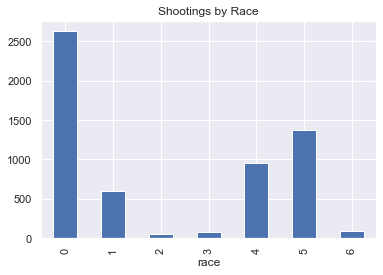

In [110]:
import collections 
group_by_race_df = model_df2.groupby("race").count()
group_by_race_df_final = group_by_race_df['age']

counter = collections.Counter(Y_train1)
for k,v in counter.items():
    per = v/len(Y_train1) * 100
    print('Class=%d, n=%d (%.3f%%)' % (k,v,per))

group_by_race_df_final.plot(x=group_by_race_df_final.index,y=group_by_race_df_final.values,kind = "bar",title="Shootings by Race")

We need to balance our dataset before training our classifier. We will balance our data by resampling. We will use an algorithm called SMOTE to augment the dataset with artificial data.

In [111]:
#!pip install imblearn
from imblearn.over_sampling import SMOTE
sm = SMOTE()
resampled_training_inputs, resampled_training_outputs_labels = sm.fit_resample(X_train1_scaled, Y_train1)

# We try to rearrange the ratio of SMOTE, because the above code upsamples the minority class to the same amount of the majority class (class 0).

# Change ratio. Rearranging the minority and increasing it by a different ratio didn't solve the problem unfortunately. We need more data to solve this problem.
# strategy = {0:2091, 1:887, 2:439, 3:446, 5:1484, 6:447}
# sm = SMOTE(sampling_strategy = strategy)
# resampled_training_inputs, resampled_training_outputs_labels = sm.fit_resample(X_train1_scaled, Y_train1)


Class=0, n=2091 (14.286%)
Class=5, n=2091 (14.286%)
Class=4, n=2091 (14.286%)
Class=3, n=2091 (14.286%)
Class=1, n=2091 (14.286%)
Class=6, n=2091 (14.286%)
Class=2, n=2091 (14.286%)


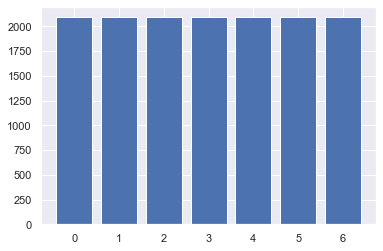

In [112]:
import collections 
counter = collections.Counter(resampled_training_outputs_labels)
for k,v in counter.items():
    per = v/len(resampled_training_outputs_labels) * 100
    print('Class=%d, n=%d (%.3f%%)' % (k,v,per))

pyplot.bar(counter.keys(), counter.values(),)
pyplot.show()

##### OneVsRestClassifier Balanced

In [113]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.neural_network import MLPClassifier
OVR_clf_b = OneVsRestClassifier(MLPClassifier(hidden_layer_sizes = [100]*5,random_state=42),n_jobs=-1)
OVR_clf_b.fit(resampled_training_inputs, resampled_training_outputs_labels)
pred_m2_1_b = OVR_clf_b.predict(resampled_training_inputs)
acc_score_m2_1_b = accuracy_score(resampled_training_outputs_labels,pred_m2_1_b)
acc_score_m2_1_b

0.8627450980392157

In [114]:
from sklearn.metrics import classification_report

print(classification_report(resampled_training_outputs_labels,pred_m2_1_b))

              precision    recall  f1-score   support

           0       0.83      0.71      0.77      2091
           1       0.83      0.84      0.83      2091
           2       0.95      0.98      0.96      2091
           3       0.93      0.95      0.94      2091
           4       0.78      0.82      0.80      2091
           5       0.77      0.78      0.77      2091
           6       0.96      0.96      0.96      2091

    accuracy                           0.86     14637
   macro avg       0.86      0.86      0.86     14637
weighted avg       0.86      0.86      0.86     14637



In [115]:
# We do a cross val on our OvR balanced model.
acc_scores_train_OvR_b = cross_val_score(OVR_clf_b, resampled_training_inputs, resampled_training_outputs_labels,scoring="accuracy",cv=10)
OvR_b_acc_scores1 = acc_scores_train_OvR_b.mean()
OvR_b_acc_scores1

0.748860414822451

##### K-Nearest Neighbors Classification Balanced

In [116]:
from sklearn.neighbors import KNeighborsClassifier
knn_classifier_b = KNeighborsClassifier()
knn_classifier_b.fit(resampled_training_inputs, resampled_training_outputs_labels)
knn_predictions_b = knn_classifier.predict(resampled_training_inputs)
acc_score_knn_b = accuracy_score(resampled_training_outputs_labels,knn_predictions_b)
acc_score_knn_b

0.2894035663045706

In [117]:
from sklearn.metrics import classification_report

print(classification_report(resampled_training_outputs_labels,knn_predictions_b))

              precision    recall  f1-score   support

           0       0.21      0.87      0.34      2091
           1       0.50      0.28      0.36      2091
           2       0.76      0.03      0.06      2091
           3       1.00      0.01      0.02      2091
           4       0.40      0.40      0.40      2091
           5       0.33      0.42      0.37      2091
           6       0.93      0.01      0.03      2091

    accuracy                           0.29     14637
   macro avg       0.59      0.29      0.23     14637
weighted avg       0.59      0.29      0.23     14637



In [118]:
# We do a cross val on our K-Nearest Neighbors balanced model.
acc_scores_train_knn_b = cross_val_score(knn_classifier_b, resampled_training_inputs, resampled_training_outputs_labels,scoring="accuracy",cv=10)
knn_b_acc_scores1 = acc_scores_train_knn_b.mean()
knn_b_acc_scores1

0.6814965879676838

##### Random Forest Balanced

In [119]:
from sklearn.ensemble import RandomForestClassifier
rf_b_classifier = RandomForestClassifier(random_state=42)
rf_b_classifier.fit(resampled_training_inputs, resampled_training_outputs_labels)
rf_b_predictions = rf_classifier.predict(resampled_training_inputs)
acc_score_rf_b = accuracy_score(resampled_training_outputs_labels,rf_b_predictions)
acc_score_rf_b

0.6069549771127963

In [120]:
from sklearn.metrics import classification_report

print(classification_report(resampled_training_outputs_labels,rf_b_predictions))

              precision    recall  f1-score   support

           0       0.40      0.93      0.56      2091
           1       0.75      0.65      0.70      2091
           2       0.96      0.37      0.53      2091
           3       0.94      0.38      0.54      2091
           4       0.65      0.68      0.66      2091
           5       0.54      0.79      0.64      2091
           6       0.92      0.45      0.60      2091

    accuracy                           0.61     14637
   macro avg       0.74      0.61      0.60     14637
weighted avg       0.74      0.61      0.60     14637



In [121]:
# We do a cross val on our Random Forest balanced model.
acc_scores_train_rf_b = cross_val_score(rf_b_classifier, resampled_training_inputs, resampled_training_outputs_labels,scoring="accuracy",cv=10)
rf_b_acc_scores1 = acc_scores_train_rf_b.mean()
rf_b_acc_scores1

0.7221521575921922

##### Neural Network Balanced

In [122]:
dnn_b_classifier = MLPClassifier(hidden_layer_sizes = [100]*5,max_iter = 800,random_state=42)
dnn_b_classifier.fit(resampled_training_inputs, resampled_training_outputs_labels)
dnn_b_predictions = dnn_b_classifier.predict(resampled_training_inputs)
acc_score_dnn_b = accuracy_score(resampled_training_outputs_labels,dnn_b_predictions)
acc_score_dnn_b

0.8424540547926488

In [123]:
from sklearn.metrics import classification_report

print(classification_report(resampled_training_outputs_labels,dnn_b_predictions))

              precision    recall  f1-score   support

           0       0.74      0.70      0.72      2091
           1       0.85      0.76      0.80      2091
           2       0.93      1.00      0.96      2091
           3       0.90      0.97      0.93      2091
           4       0.76      0.78      0.77      2091
           5       0.76      0.73      0.75      2091
           6       0.95      0.95      0.95      2091

    accuracy                           0.84     14637
   macro avg       0.84      0.84      0.84     14637
weighted avg       0.84      0.84      0.84     14637



In [124]:
# We do a cross val on our Neural Network balanced model.
acc_scores_train_dnn_b = cross_val_score(dnn_b_classifier, resampled_training_inputs, resampled_training_outputs_labels,scoring="accuracy",cv=10)
dnn_b_acc_scores1 = acc_scores_train_dnn_b.mean()
dnn_b_acc_scores1

0.7362889806483421

##### Summary Model 2 - Round 2

In [125]:
p_table_m2_b = PrettyTable()
p_table_m2_b.field_names = ["Model","Accuracy Score","CrossVal Score"]
p_table_m2_b.add_row(["OneVsRestClassifier",acc_score_m2_1_b,OvR_b_acc_scores1])
p_table_m2_b.add_row(["K-Nearest Neighbors Classification",acc_score_knn_b,knn_acc_scores1])
p_table_m2_b.add_row(["Random Forest",acc_score_rf_b,rf_b_acc_scores1])
p_table_m2_b.add_row(["Neural Network",acc_score_dnn_b,dnn_b_acc_scores1])

print(p_table_m2_b)

+------------------------------------+--------------------+--------------------+
|               Model                |   Accuracy Score   |   CrossVal Score   |
+------------------------------------+--------------------+--------------------+
|        OneVsRestClassifier         | 0.8627450980392157 | 0.748860414822451  |
| K-Nearest Neighbors Classification | 0.2894035663045706 | 0.4202434714313764 |
|           Random Forest            | 0.6069549771127963 | 0.7221521575921922 |
|           Neural Network           | 0.8424540547926488 | 0.7362889806483421 |
+------------------------------------+--------------------+--------------------+


###### We evaluate on the test set

In [126]:
final_model2_prediction = OVR_clf_b.predict(X_test1_scaled)
final_model2_accuracy = accuracy_score(Y_test1,final_model2_prediction)
final_model2_accuracy

0.3716508210890233